<a href="https://www.kaggle.com/code/tylerchi/concretestrengthpredictionfeb?scriptVersionId=120758565" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [ ]:
!pip install -U --pre pycaret
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pycaret.regression import *

In [6]:
train_df = pd.read_csv('/kaggle/input/playground-series-s3e9/train.csv')
test_df = pd.read_csv('/kaggle/input/playground-series-s3e9/test.csv')

In [7]:
train_df.head()

,id,CementComponent,BlastFurnaceSlag,FlyAshComponent,WaterComponent,SuperplasticizerComponent,CoarseAggregateComponent,FineAggregateComponent,AgeInDays,Strength
0,0,525.0,0.0,0.0,186.0,0.0,1125.0,613.0,3,10.38
1,1,143.0,169.0,143.0,191.0,8.0,967.0,643.0,28,23.52
2,2,289.0,134.7,0.0,185.7,0.0,1075.0,795.3,28,36.96
3,3,304.0,76.0,0.0,228.0,0.0,932.0,670.0,365,39.05
4,4,157.0,236.0,0.0,192.0,0.0,935.4,781.2,90,74.19


In [8]:
train_df.dtypes

id                             int64
CementComponent              float64
BlastFurnaceSlag             float64
FlyAshComponent              float64
WaterComponent               float64
SuperplasticizerComponent    float64
CoarseAggregateComponent     float64
FineAggregateComponent       float64
AgeInDays                      int64
Strength                     float64
dtype: object

In [9]:
train_df.nunique()

id                           5407
CementComponent               314
BlastFurnaceSlag              224
FlyAshComponent               177
WaterComponent                215
SuperplasticizerComponent     112
CoarseAggregateComponent      342
FineAggregateComponent        376
AgeInDays                      15
Strength                      843
dtype: int64

* All numeric data

In [10]:
train_df.drop('id', axis=1, inplace=True)

In [11]:
num_cols = [col for col in train_df.columns]

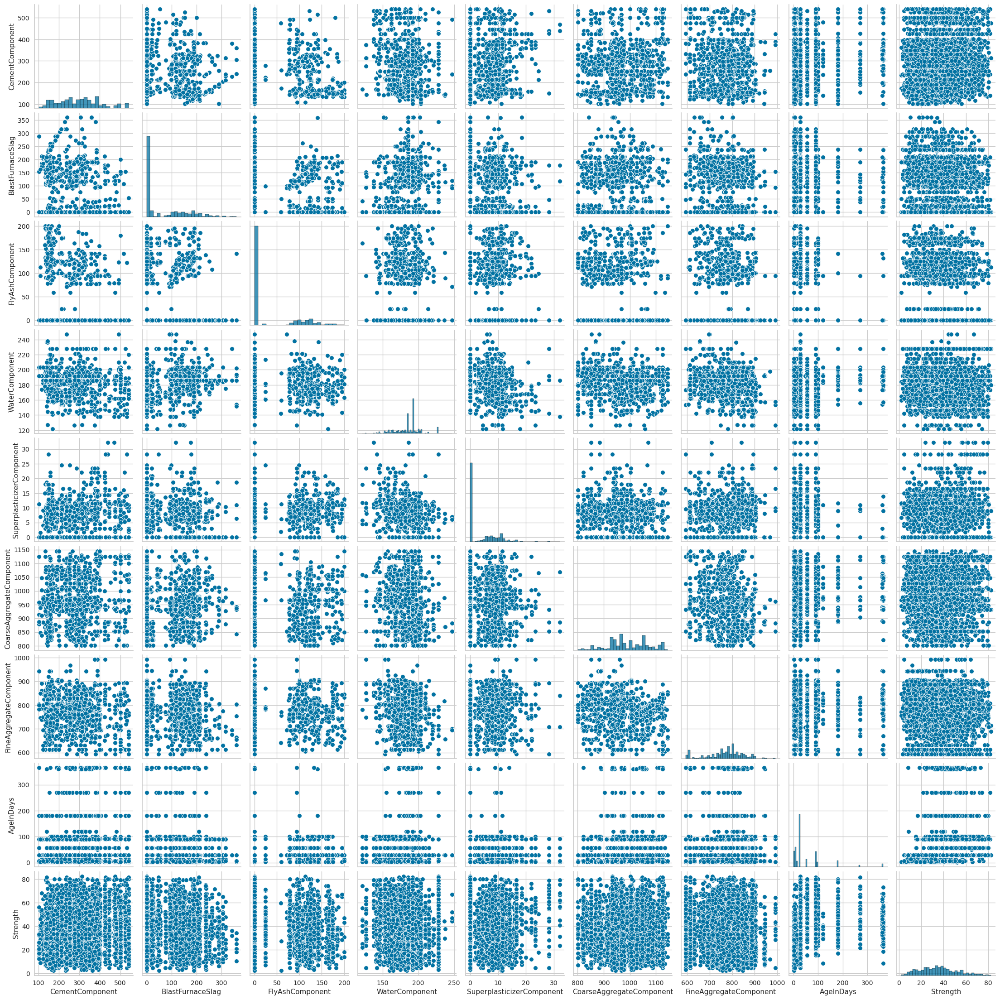

In [12]:
sns.pairplot(train_df)

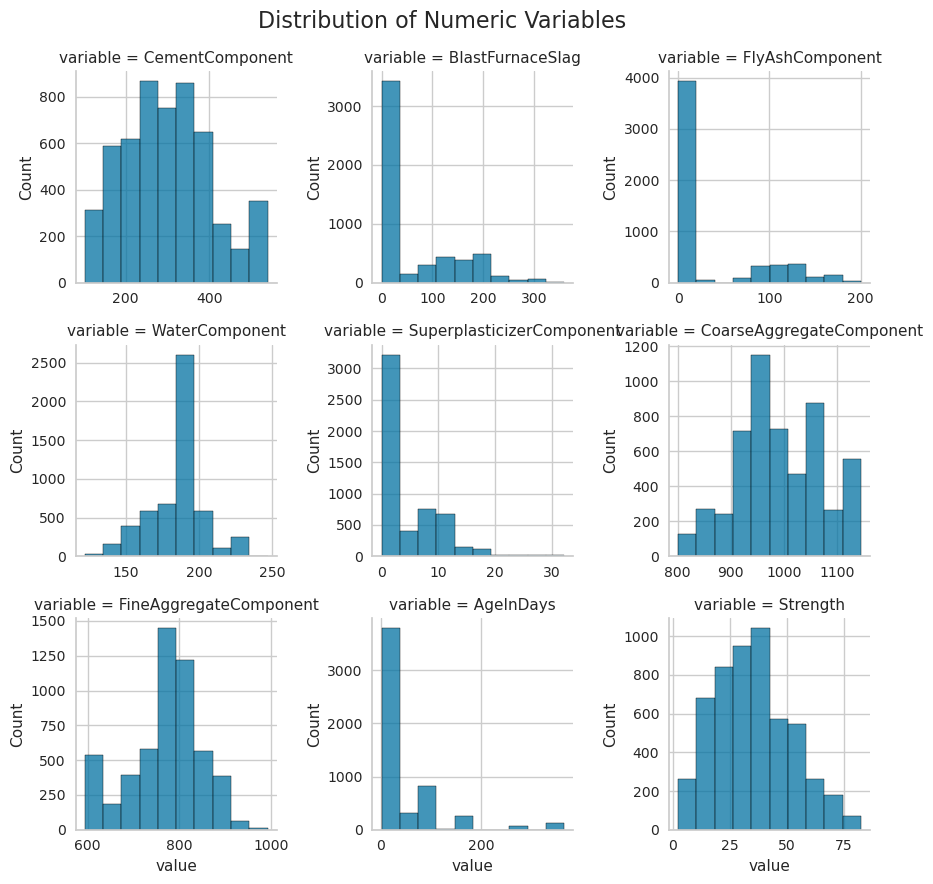

In [13]:
# Create a FacetGrid with one plot for each numeric variable
g = sns.FacetGrid(train_df[num_cols].melt(), col='variable', col_wrap=3, sharex=False, sharey=False)

# Map a histogram to each plot
g.map(sns.histplot, 'value', bins=10)

# Set the main title for the whole facet grid
g.fig.suptitle('Distribution of Numeric Variables', fontsize=16)

# Adjust the spacing between subplots
g.fig.tight_layout()

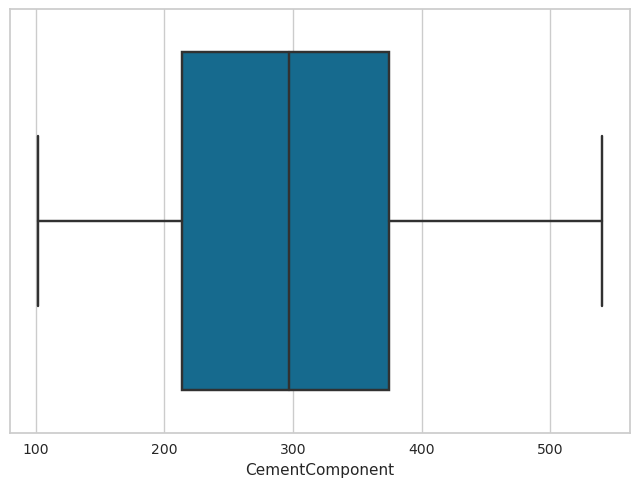

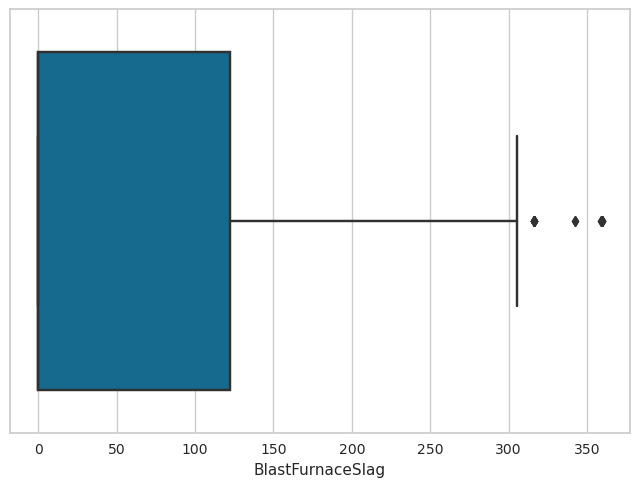

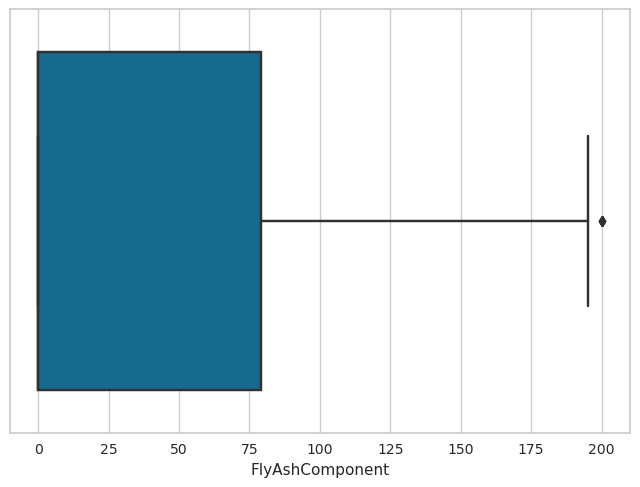

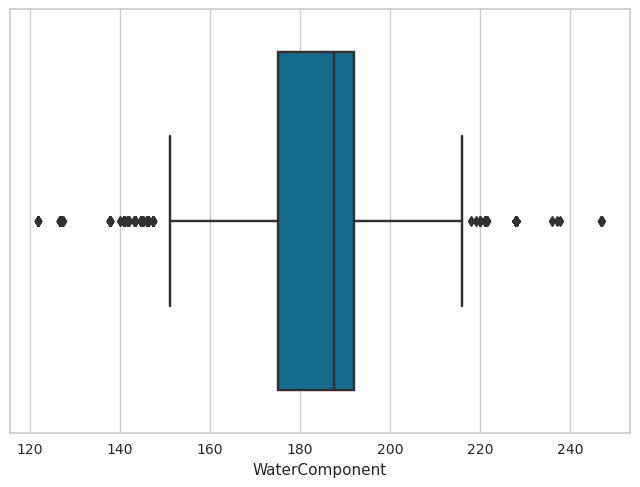

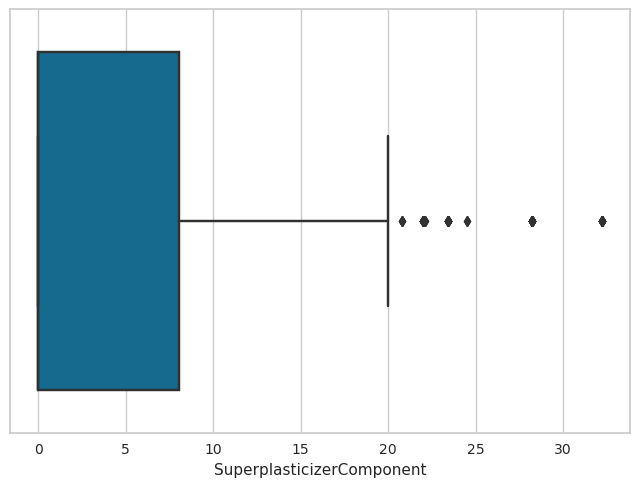

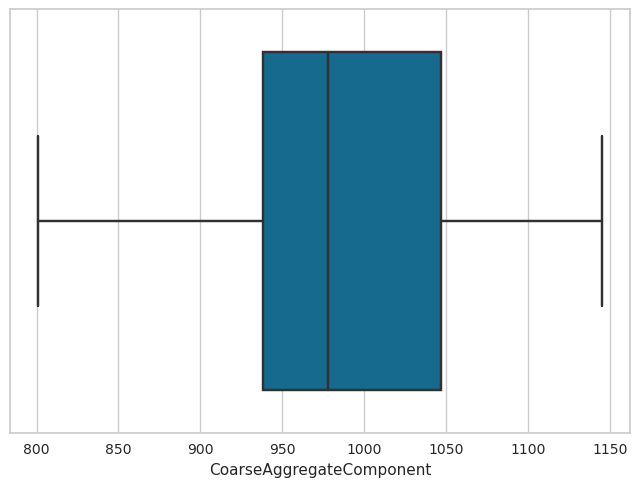

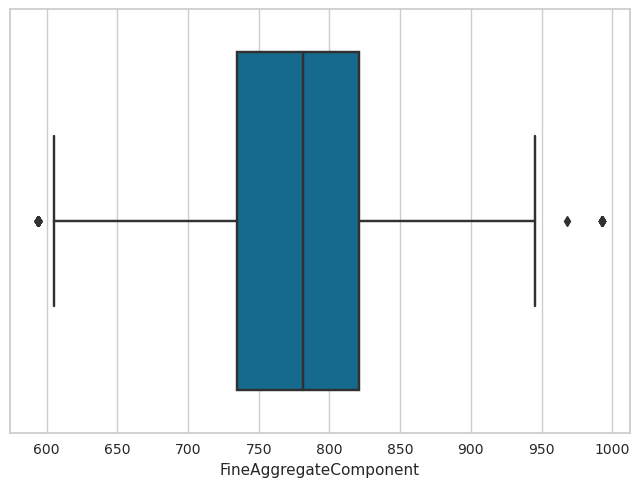

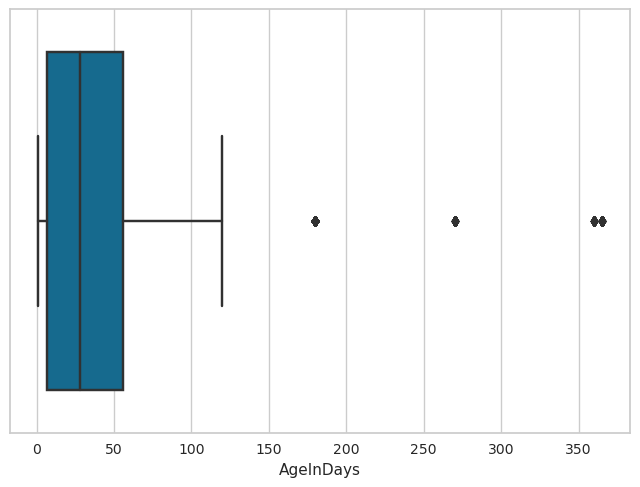

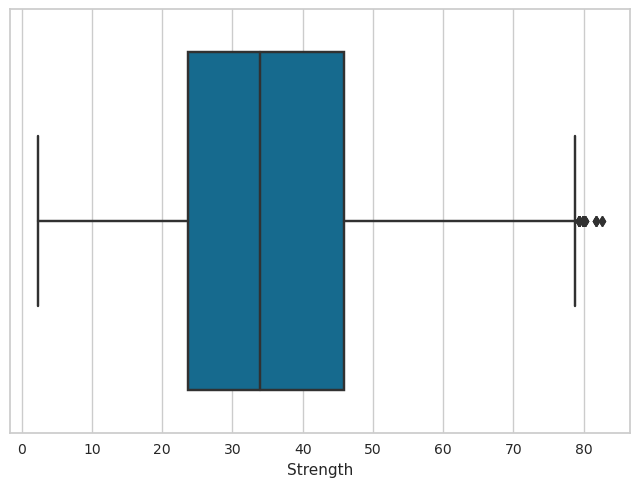

In [14]:
for col in train_df.columns:
    sns.boxplot(data=train_df,x=train_df[col],)
    plt.show()

* Right skew BlastFurnaceSlag, FlyAshComponent, SuperplasticizerComponent, AgeInDays
* 

Compare train and test distribution

In [19]:
num_cols[:-1]

['CementComponent',
 'BlastFurnaceSlag',
 'FlyAshComponent',
 'WaterComponent',
 'SuperplasticizerComponent',
 'CoarseAggregateComponent',
 'FineAggregateComponent',
 'AgeInDays']

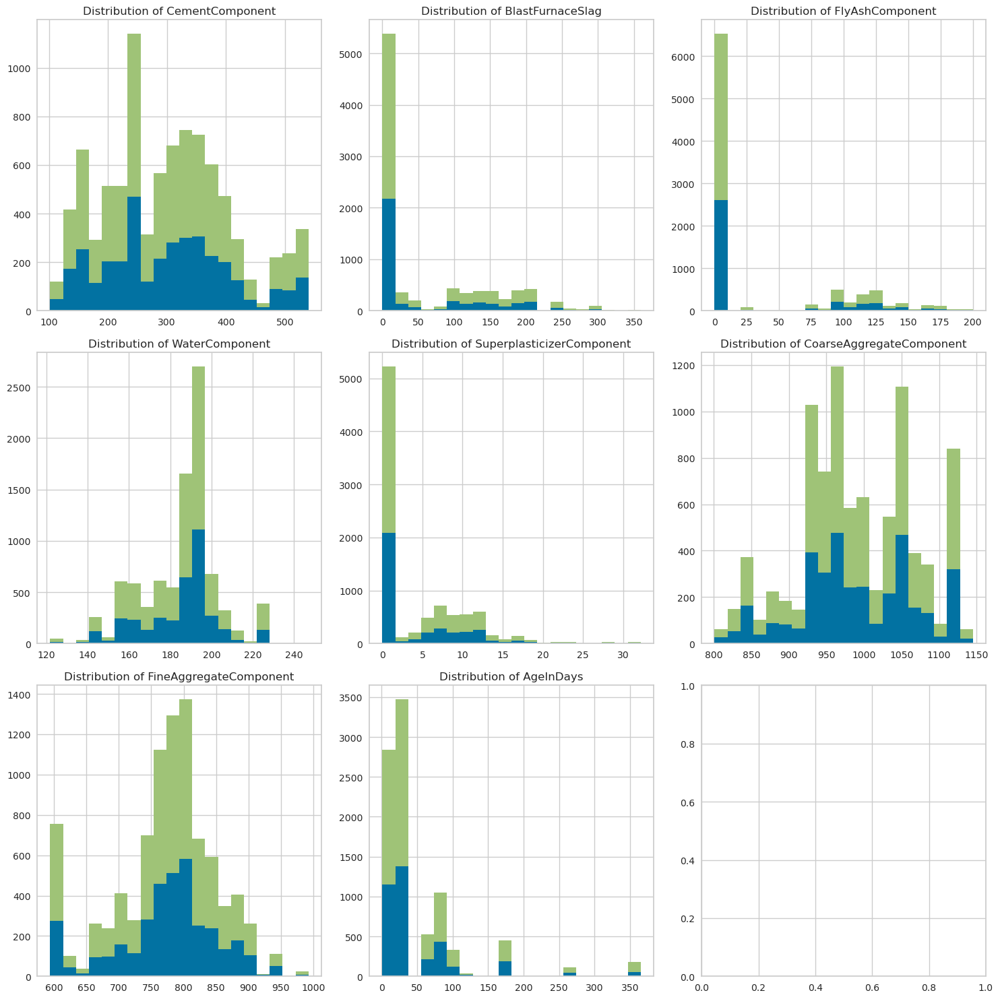

In [20]:
train_temp = train_df.copy()
train_temp['dataset'] = 'train'
test_temp = test_df.copy()
test_temp['dataset'] = 'test'
num_rows = 3
number_cols = 3

# Create the subplots
fig, axes = plt.subplots(num_rows,number_cols,figsize=(15, 5*3))

# Loop through each column and plot the distribution
for i, col in enumerate(num_cols[:-1]):
    row_idx = i // number_cols
    col_idx = i % number_cols
    ax = axes[row_idx, col_idx]
    ax.hist([test_df[col], train_df[col]], bins=20, label=['test','train'], stacked=True)
    ax.set_title(f'Distribution of {col}')

# Show the plot
plt.tight_layout()
plt.show()

# Previous Ideas

* standard scaler with gradient boosting regressor. GridSearchCV

In [ ]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import GradientBoostingRegressor
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import mean_squared_error

# X=train_df.drop(['Strength'], axis=1)
# y=train_df.Strength

# X_train, X_test, y_train, y_test = train_test_split(X, y,
#                       test_size = 0.20, random_state = 42)

# std_scaler = StandardScaler()

# X_train_scaled = std_scaler.fit_transform(X_train)
# X_test_scaled = std_scaler.transform(X_test)

# param_grid = {
#     'n_estimators': [1000],
#     'learning_rate': [0.01],
#     'max_depth': [2,5,10],
#     #'min_samples_split': [2, 5, 10],
#     #'min_samples_leaf': [1, 2, 4, 10],
#     #'subsample': [0.5, 0.8, 1.0],
#     'max_features': ['sqrt']
# }

# GBR = GradientBoostingRegressor(random_state=42)

# grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# grid_search.fit(X_train_scaled, y_train)

# print(f'Best hyperparameters: {grid_search.best_params_}')
# print(f'Mean squared error on validation set: {-grid_search.best_score_:.4f}')

# best_model = grid_search.best_estimator_
# y_pred = best_model.predict(X_test_scaled)
# mse = mean_squared_error(y_test, y_pred)

In [21]:
# fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

# for i, col in enumerate(num_cols):
#     ax = axs[i]
#     ax.hist(train_df[col], bins=10)
#     ax.set_title(col)
    
# fig.suptitle('Distribution of Numeric Variables', fontsize=16)
# plt.tight_layout()

## Baseline no data transformation

In [23]:
exp1 = setup(data=train_df,target='Strength',session_id=123, profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
best_no_transformation = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,9.4217,147.4830,12.1320,0.4525,0.3805,0.3603,0.1830
ridge,Ridge Regression,9.3951,149.2338,12.2038,0.4463,0.3813,0.3580,0.0180
br,Bayesian Ridge,9.3974,149.2506,12.2044,0.4463,0.3815,0.3585,0.0180
lr,Linear Regression,9.3939,149.2589,12.2050,0.4462,0.3813,0.3574,0.5040
catboost,CatBoost Regressor,9.5496,154.4907,12.4175,0.4268,0.3866,0.3601,2.6450
lightgbm,Light Gradient Boosting Machine,9.5887,155.1037,12.4428,0.4243,0.3863,0.3613,0.2870
rf,Random Forest Regressor,10.0048,167.8056,12.9434,0.3775,0.4005,0.3723,0.7150
xgboost,Extreme Gradient Boosting,10.0048,169.3840,12.9974,0.3719,0.4039,0.3721,0.3550
ada,AdaBoost Regressor,10.5353,173.4370,13.1613,0.3564,0.4143,0.4200,0.0550
et,Extra Trees Regressor,10.4633,186.2744,13.6328,0.3095,0.4229,0.3865,0.5000


## Scale Data

In [25]:
exp3 = setup(data=train_df,target='Strength',session_id=123, normalize=True)


,Description,Value
0,session_id,123
1,Target,Strength
2,Original Data,"(5407, 9)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(3784, 22)"


In [26]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,9.4217,147.4872,12.1322,0.4525,0.3805,0.3603,0.4710
ridge,Ridge Regression,9.3952,149.2332,12.2038,0.4463,0.3813,0.3580,0.0130
br,Bayesian Ridge,9.3974,149.2493,12.2043,0.4463,0.3815,0.3585,0.0180
lr,Linear Regression,9.3939,149.2589,12.2050,0.4462,0.3813,0.3574,0.0170
huber,Huber Regressor,9.2931,150.8604,12.2696,0.4403,0.3770,0.3412,0.1310
catboost,CatBoost Regressor,9.5506,154.5139,12.4185,0.4267,0.3866,0.3601,2.5990
lightgbm,Light Gradient Boosting Machine,9.6075,156.2221,12.4865,0.4202,0.3873,0.3620,0.1510
rf,Random Forest Regressor,10.0039,167.7812,12.9425,0.3776,0.4004,0.3722,1.5740
xgboost,Extreme Gradient Boosting,10.0027,169.3354,12.9954,0.3721,0.4039,0.3720,0.9410
ada,AdaBoost Regressor,10.5353,173.4370,13.1613,0.3564,0.4143,0.4200,0.1220


GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [27]:
param_grid5 = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.1],
    'max_depth': [3, 4, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.5, 0.8, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

In [28]:
gbr5 = create_model('gbr')
tuned_gbr5 = tune_model(gbr5, custom_grid = param_grid5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,8.9095,138.0324,11.7487,0.4109,0.3608,0.3266
1,9.6442,158.0328,12.5711,0.4479,0.4130,0.4044
2,9.3166,145.9161,12.0796,0.4824,0.3823,0.3673
3,10.1597,168.1248,12.9663,0.4082,0.4117,0.3901
4,9.1807,138.9021,11.7857,0.4365,0.3613,0.3403
5,9.0498,138.7295,11.7783,0.4798,0.3663,0.3417
6,9.9033,158.1773,12.5769,0.4200,0.3973,0.3824
7,9.9859,160.8103,12.6811,0.4448,0.3832,0.3719
8,8.7496,127.0210,11.2704,0.5149,0.3706,0.3458


In [29]:
print(tuned_gbr5)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features='sqrt', max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=4, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=0.8, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)


In [30]:
evaluate_model(tuned_gbr5)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

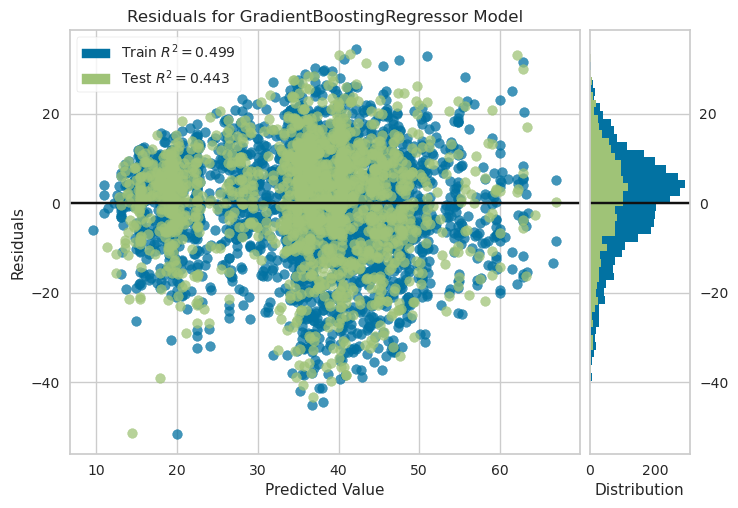

In [31]:
plot_model(tuned_gbr5, plot='residuals')

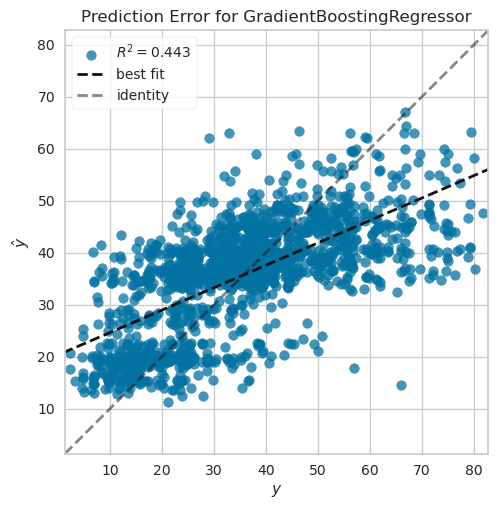

In [32]:
plot_model(tuned_gbr5, plot='error')

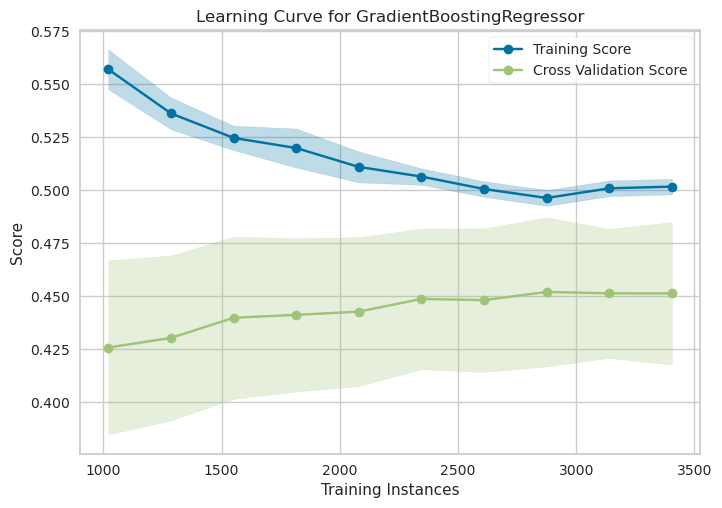

In [33]:
plot_model(tuned_gbr5,plot='learning')

In [34]:
gbr = create_model('gbr')
boosted_gbr = ensemble_model(gbr, method='Boosting')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,9.1723,141.4692,11.8941,0.3962,0.3698,0.3512
1,10.0881,163.8386,12.7999,0.4277,0.4265,0.4357
2,9.8186,158.8285,12.6027,0.4366,0.4042,0.4015
3,10.2810,167.8375,12.9552,0.4092,0.4186,0.4146
4,9.5346,145.9895,12.0826,0.4078,0.3772,0.3691
5,9.3823,144.3991,12.0166,0.4586,0.3749,0.3637
6,10.3188,162.6896,12.7550,0.4035,0.4097,0.4113
7,10.4190,169.9154,13.0352,0.4134,0.4051,0.4087
8,9.2323,132.6595,11.5178,0.4934,0.3857,0.3790


In [35]:
blender = blend_models(compare_models(n_select = 3))

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,8.8015,135.5398,11.6422,0.4215,0.3584,0.3254
1,9.6132,158.7006,12.5976,0.4456,0.4122,0.4012
2,9.1810,142.4023,11.9332,0.4949,0.3809,0.3622
3,10.2050,169.3792,13.0146,0.4038,0.4097,0.3883
4,9.0621,137.2813,11.7167,0.4431,0.3589,0.3379
5,8.9350,137.4176,11.7225,0.4847,0.3629,0.3315
6,9.9005,158.7004,12.5976,0.4181,0.3932,0.3753
7,9.9725,161.7667,12.7188,0.4415,0.3850,0.3717
8,8.7441,126.5733,11.2505,0.5166,0.3679,0.3434


## Improvements were seen using the original Concrete Dataset
https://www.kaggle.com/code/samuraikaggle/automl-pycaret-ensemble-s3e9

In [36]:
original = pd.read_csv('/kaggle/input/predict-concrete-strength/ConcreteStrengthData.csv')

In [37]:
original.head()

,CementComponent,BlastFurnaceSlag,FlyAshComponent,WaterComponent,SuperplasticizerComponent,CoarseAggregateComponent,FineAggregateComponent,AgeInDays,Strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [38]:
original['CementComponent'] = original['CementComponent ']
original.drop('CementComponent ',axis=1,inplace=True)
combined_df = pd.concat([train_df.copy(),original.copy()],ignore_index=True)

In [39]:
combined_exp1 = setup(data=combined_df,target='Strength',session_id=123, normalize=True)

,Description,Value
0,session_id,123
1,Target,Strength
2,Original Data,"(6437, 9)"
3,Missing Values,False
4,Numeric Features,7
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(4505, 22)"


In [40]:
combined_best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,9.0230,137.8482,11.7356,0.4917,0.3685,0.3442,0.5320
lar,Least Angle Regression,9.0541,140.4995,11.8505,0.4818,0.3726,0.3450,0.0180
ridge,Ridge Regression,9.0596,140.5613,11.8530,0.4816,0.3727,0.3457,0.0160
lr,Linear Regression,9.0579,140.5808,11.8539,0.4815,0.3726,0.3450,0.0150
br,Bayesian Ridge,9.0608,140.5780,11.8537,0.4815,0.3728,0.3460,0.0180
huber,Huber Regressor,8.9627,141.9477,11.9114,0.4766,0.3703,0.3315,0.1510
lightgbm,Light Gradient Boosting Machine,9.0951,142.0785,11.9117,0.4759,0.3720,0.3424,0.1570
catboost,CatBoost Regressor,9.0697,142.0952,11.9123,0.4757,0.3702,0.3386,2.8240
xgboost,Extreme Gradient Boosting,9.4644,155.0790,12.4417,0.4279,0.3866,0.3508,1.0630
rf,Random Forest Regressor,9.5430,156.3645,12.4927,0.4231,0.3868,0.3523,1.7740


param_grid5 = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.1],
    'max_depth': [3, 4, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.5, 0.8, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

In [55]:
combined_gbr1 = create_model('gbr')
tuned_combined_gbr1 = tune_model(combined_gbr1, custom_grid = param_grid5)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,9.4672,153.1451,12.3752,0.4011,0.3568,0.3138
1,9.1074,140.7296,11.8630,0.4942,0.3631,0.3435
2,8.7673,132.7532,11.5219,0.5066,0.3734,0.3518
3,8.7566,134.3009,11.5888,0.5178,0.3618,0.3390
4,9.0676,139.4926,11.8107,0.5113,0.3827,0.3634
5,8.8236,128.9483,11.3555,0.4908,0.3877,0.3709
6,9.2120,137.7937,11.7386,0.4827,0.3594,0.3317
7,9.4082,144.5462,12.0227,0.5045,0.3726,0.3531
8,8.5132,125.9736,11.2238,0.5231,0.3804,0.3620


In [53]:
print(tuned_combined_gbr1)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features='sqrt', max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=4, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=0.8, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)


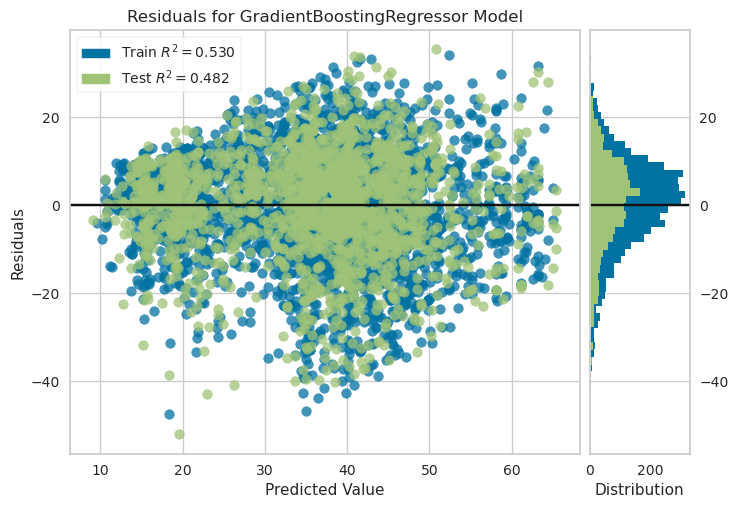

In [56]:
plot_model(tuned_combined_gbr1, plot='residuals')

In [42]:
test_df.tail()

,id,CementComponent,BlastFurnaceSlag,FlyAshComponent,WaterComponent,SuperplasticizerComponent,CoarseAggregateComponent,FineAggregateComponent,AgeInDays
3600,9007,140.0,129.0,100.0,200.0,7.0,864.0,753.0,28
3601,9008,281.0,0.0,0.0,186.0,0.0,1104.0,774.0,28
3602,9009,289.0,133.0,0.0,194.0,7.0,924.0,760.0,28
3603,9010,469.0,117.2,0.0,137.8,32.2,852.1,840.5,3
3604,9011,332.5,142.5,0.0,228.0,0.0,932.0,594.0,7


In [43]:
preds = predict_model(combined_best, data = test_df.drop('id',axis=1))

In [44]:
preds

,CementComponent,BlastFurnaceSlag,FlyAshComponent,WaterComponent,SuperplasticizerComponent,CoarseAggregateComponent,FineAggregateComponent,AgeInDays,Label
0,166.1,75.4,163.8,173.8,4.6,1007.2,746.6,56,43.017007
1,304.0,0.0,0.0,190.0,0.0,998.0,801.0,7,19.092587
2,225.0,0.0,0.0,185.0,0.0,1113.0,833.0,28,34.081888
3,251.4,0.0,118.3,188.5,6.4,1028.4,757.7,100,46.071154
4,144.0,15.0,195.0,176.0,6.0,1021.0,709.0,28,22.481344
...,...,...,...,...,...,...,...,...,...
3600,140.0,129.0,100.0,200.0,7.0,864.0,753.0,28,32.229674
3601,281.0,0.0,0.0,186.0,0.0,1104.0,774.0,28,36.116667
3602,289.0,133.0,0.0,194.0,7.0,924.0,760.0,28,40.026357
3603,469.0,117.2,0.0,137.8,32.2,852.1,840.5,3,35.227213


In [45]:
sample_submission = pd.read_csv('/kaggle/input/playground-series-s3e9/sample_submission.csv')
sample_submission.head(2)

,id,Strength
0,5407,35.452
1,5408,35.452


In [47]:
data = {'id': test_df.id, 'Strength': preds['Label']}

In [48]:
new_df = pd.DataFrame(data)

In [49]:
new_df.head()

,id,Strength
0,5407,43.017007
1,5408,19.092587
2,5409,34.081888
3,5410,46.071154
4,5411,22.481344


In [50]:
new_df.to_csv('submission.csv',index=False)